# 52 — Training Cellpose on bees

The bees come at three scales: 282 px in comb_03, 128 in comb_01, 69 in comb_05.
Train one model on all of them, then run it on every comb image.

Driven through the ai-lab API rather than the ops directly -- the augmenter turns
three label crops into a real training set, and the segmenter wraps the same
`train_cellpose3/4` ops underneath.

`rescale=False` is the point. Rescaling resizes each patch so its objects match
the diameter the network expects, which throws the size range away -- and the
size range is what we want the model to learn.

In [5]:
from datetime import datetime
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import tifffile
from skimage.io import imread
from tnia.plotting.plt_helper import mask_outline_overlay

from napari_ai_lab.Augmenters.albumentations_augmenter import AlbumentationsAugmenter
from napari_ai_lab.models.image_data_model import ImageDataModel
from napari_ai_lab.Segmenters.GlobalSegmenters.Cellpose3SkopSegmenter import (
    Cellpose3SkopSegmenter,
)
from napari_ai_lab.Segmenters.GlobalSegmenters.Cellpose4SkopSegmenter import (
    Cellpose4SkopSegmenter,
)

plt.rcParams["figure.dpi"] = 72

# 'cellposedino', 'cellposesam' or 'cellpose3'.
# cellposedino is the ViT-B backbone -- about 4 GB to finetune, against 12 for
# the others.
ARCH = "cellposedino"
stamp = datetime.now().strftime("%Y-%m-%d_%H%M")
training_model_name = f"bees_{ARCH}_{stamp}"
print(f"Training model name: {training_model_name}")

SEGMENTER, INITIAL_MODEL, BATCH = {
    "cellposedino": (Cellpose4SkopSegmenter, "cpdino_vitb", 1),
    "cellposesam": (Cellpose4SkopSegmenter, "cpsam_v2", 1),
    "cellpose3": (Cellpose3SkopSegmenter, "cyto3", 8),
}[ARCH]

PROJECT = Path("data/bees").resolve()
PATCH = 256

Training model name: bees_cellposedino_2026-09-17_1705


## Augment

The project has three label crops in `labels/input0` and `labels/truth0`. The
augmenter draws `num_patches` patches out of each.

In [6]:
data_model = ImageDataModel(str(PROJECT))
data_model.delete_patches(axis="yxc")

data_model.set_augmenter(AlbumentationsAugmenter())
data_model.set_patch_size((PATCH, PATCH))
data_model.set_num_patches(80)

patches_dir = data_model.generate_patches_from_labels()

inputs = sorted(Path(patches_dir, "input0").glob("*.tif"))
truths = sorted(Path(patches_dir, "ground_truth0").glob("*.tif"))
print(f"{patches_dir}\n{len(inputs)} patches")

🎨 Generating 80 patches × 3 label crop(s) = 240 total...
Computed global normalization stats: low=0.0000, high=233.0000
  size range: asked for 30-200px long axis, but this image can only reach 608-200px -- shrinking further would need a crop larger than the image
  Generating patches for comb_01_00000.tif (10/240)
  Generating patches for comb_01_00000.tif (20/240)
  Generating patches for comb_01_00000.tif (30/240)
  Generating patches for comb_01_00000.tif (40/240)
  Generating patches for comb_01_00000.tif (50/240)
  Generating patches for comb_01_00000.tif (60/240)
  Generating patches for comb_01_00000.tif (70/240)
  Generating patches for comb_01_00000.tif (80/240)
Computed global normalization stats: low=0.0000, high=233.0000
  size range: asked for 30-200px long axis, but this image can only reach 97-200px -- shrinking further would need a crop larger than the image
  Generating patches for comb_03_00000.tif (90/240)
  Generating patches for comb_03_00000.tif (100/240)
  Gener

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB dat

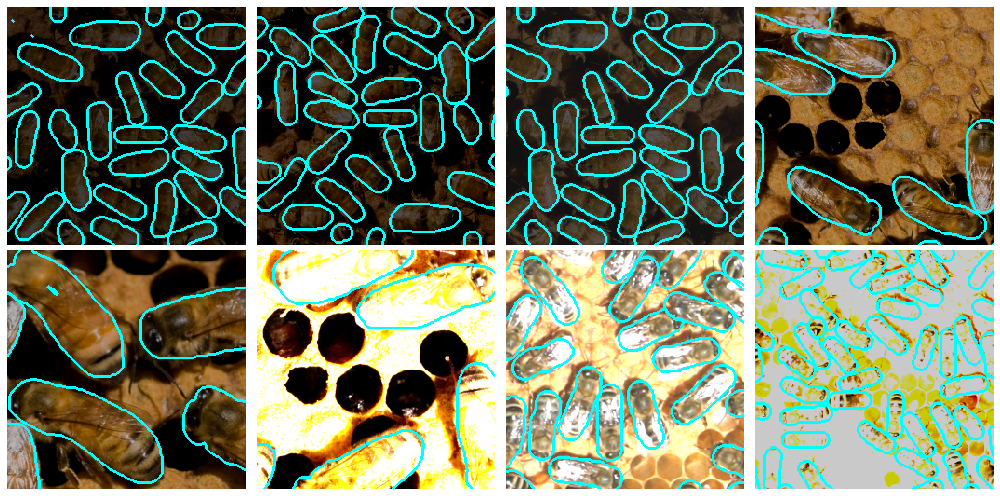

In [7]:
fig, axes = plt.subplots(2, 4, figsize=(14, 7))
step = max(1, len(inputs) // 8)
for ax, im, tr in zip(axes.ravel(), inputs[::step], truths[::step]):
    ax.imshow(mask_outline_overlay(tifffile.imread(im), tifffile.imread(tr)))
for ax in axes.ravel():
    ax.axis("off")
fig.tight_layout()

## Train

In [8]:
segmenter = SEGMENTER()
segmenter.rescale = False
segmenter.num_epochs = 100
segmenter.train_patch_size_xy = PATCH
segmenter.train_batch_size = BATCH
# An epoch is 50 patches, not all of them -- otherwise epoch length
# follows however many patches were generated.
segmenter.nimg_per_epoch = 50

segmenter.patch_path = str(patches_dir)
segmenter.training_model_name = training_model_name 

continue_training = True
if continue_training:
    segmenter.initial_model_name = segmenter.training_model_name
else:
    segmenter.initial_model_name = INITIAL_MODEL

segmenter.model_save_dir = str(PROJECT / "models")

# train() prints nothing without an updater -- it is how the GUI gets progress.
def show(current, maximum, message):
    print(f"{current}/{maximum}  {message}", flush=True)

result = segmenter.train(show)
print(result["message"])

Training complete. Model saved to: C:\Users\bnort\work\ImageJ2022\tnia\i2k-2026\notebooks\data\bees\models\models\bees_cellposedino_2026-09-17_1705


bees_cellposedino_2026-09-17_1705_history.csv: 11 rows, runs ['1'], to epoch 91


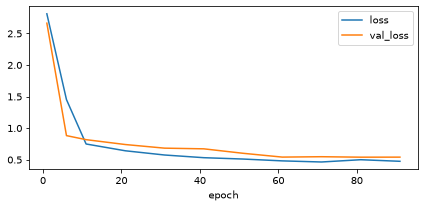

In [9]:
import csv

# The model just trained, not whatever sorts last in the directory.
history_file = next(Path(segmenter.model_save_dir).rglob(
    f"{segmenter.training_model_name}_history.csv"))
with open(history_file) as f:
    history = list(csv.DictReader(f))

epochs = [int(r["epoch"]) for r in history]

fig, ax = plt.subplots(figsize=(6, 3))
ax.plot(epochs, [float(r["loss"]) for r in history], label="loss")
ax.plot(epochs, [float(r["val_loss"]) for r in history], label="val_loss")

# One line per continuation, at the epoch the new run picked up from.
for before, after in zip(history, history[1:]):
    if before["run"] != after["run"]:
        ax.axvline(int(after["epoch"]), color="k", linestyle="--", linewidth=1)
        ax.text(int(after["epoch"]), ax.get_ylim()[1], f' run {after["run"]}',
                va="top", fontsize=8)

ax.set_xlabel("epoch")
ax.legend()
fig.tight_layout()
print(f"{history_file.name}: {len(history)} rows, "
      f"runs {sorted({r['run'] for r in history})}, to epoch {epochs[-1]}")

## Run it on every comb

Seven full images at their own scales, four of which have no labels at all. The
question is whether the model learned bees or learned the three crops it saw.

In [10]:
# train() points inference at the model it just wrote.
print("segmenting with", segmenter.inference_model_name)

results = {}
for path in sorted(PROJECT.glob("comb_*.png")):
    image = imread(path)[..., :3]
    masks = segmenter.segment(image)
    results[path.stem] = (image, masks)
    print(f"{path.stem}: {int(masks.max())} bees")

segmenting with bees_cellposedino_2026-09-17_1705
comb_01: 204 bees
comb_02: 324 bees
comb_03: 44 bees
comb_04: 109 bees
comb_05: 704 bees
comb_06: 940 bees
comb_07: 1162 bees


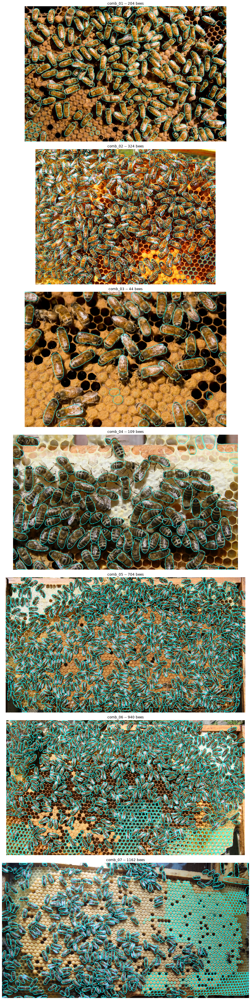

In [11]:
fig, axes = plt.subplots(len(results), 1, figsize=(13, 7 * len(results)))
for ax, (name, (image, masks)) in zip(np.atleast_1d(axes), results.items()):
    ax.imshow(mask_outline_overlay(image, masks))
    ax.set_title(f"{name} -- {int(masks.max())} bees")
    ax.axis("off")
fig.tight_layout()